In [166]:
import warnings
warnings.filterwarnings('ignore')

In [167]:
import scanpy as sc
import scvelo
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

from statannotations.Annotator import Annotator

In [168]:
sc.set_figure_params(vector_friendly=True, dpi_save=300) 
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams.update({
    'pdf.fonttype': 42, 
    'ps.fonttype': 42 
})
sns.set_style("whitegrid")

In [5]:
deconv_res = []
for index in range(3, 14):
    res = pd.read_excel("./Results/Others/41592_2025_2622_MOESM4_ESM.xlsx", 
                       sheet_name=index-1,
                       skiprows=1, 
                       header=0)
    res = res.set_index(res.columns[0])
    deconv_res.append(res)

In [ ]:
sigmod = pd.read_csv("./Results/SIGMOD_theta_logit.csv", 
                    index_col=0)
deconv_res.append(sigmod)

In [195]:
deconv_res[11] = sigmod

In [152]:
celltypes = ["Astro", "BCell", "DG", "Endo", "L2/3 IT CTX", "L4/5 IT CTX", "L5 IT CTX", "L5 PT CTX",
             "L5/6 NP CTX", "L6 CT CTX", "L6 IT CTX", "L6b CTX", "Lamp5", "Macrophage", "Microglia", 
             "Neutrophil", "Oligo", "Pvalb", "Sncg", "Sst", "Sst Chodl", "TCell", "Vip", "L4 IT CTX", 
             "L5/6 IT CTX", "SUB", "CA"]

In [196]:
deconv_cor = []
absolute_err = []
ct_cor = []
for index in range(1, 12):
    print(index + 1)
    mat1 = deconv_res[index]
    mat2 = deconv_res[0]

    mat1 = mat1.loc[mat2.index]
    mat1 = mat1[celltypes]
    mat2 = mat2[celltypes]
    
    correlations = [pearsonr(mat1.iloc[i], mat2.iloc[i])[0] for i in range(len(mat1))]
    deconv_cor.append(correlations)

    absolute_errors = [np.sum(np.abs(mat1.iloc[i] - mat2.iloc[i])) for i in range(len(mat1))]
    absolute_err.append(absolute_errors)

    mat1 = mat1.T
    mat2 = mat2.T
    correlations = [pearsonr(mat1.iloc[i], mat2.iloc[i])[0] for i in range(len(mat1))]
    ct_cor.append(correlations)

2
3
4
5
6
7
8
9
10
11
12


In [197]:
deconv_cor_df = pd.DataFrame(np.column_stack(deconv_cor),
                           columns=["Spotiphy", "c2l", "CytoSPACE", "CARD", "Tangram", 
                                  "RCTD","SpaScope","SpaDWLS","CIBERSORT","SPOTlight","SIGMOD"])
absolute_err_df = pd.DataFrame(np.column_stack(absolute_err),
                           columns=["Spotiphy", "c2l", "CytoSPACE", "CARD", "Tangram", 
                                  "RCTD","SpaScope","SpaDWLS","CIBERSORT","SPOTlight","SIGMOD"])
ct_cor_df = pd.DataFrame(np.column_stack(ct_cor),
                           columns=["Spotiphy", "c2l", "CytoSPACE", "CARD", "Tangram", 
                                  "RCTD","SpaScope","SpaDWLS","CIBERSORT","SPOTlight","SIGMOD"])

In [198]:
deconv_cor_df_melt = deconv_cor_df.melt()
deconv_cor_df_melt.columns = ['Methods', 'Cor']

In [ ]:
# category_order = ["SIGMOD","Spotiphy", "c2l", "CytoSPACE", "CARD", "Tangram", 
#                   "RCTD","SpaScope","SpaDWLS","CIBERSORT","SPOTlight"]
# deconv_cor_df_melt['Methods'] = pd.Categorical(deconv_cor_df_melt['Methods'], 
#                                           categories=category_order, 
#                                           ordered=True)

In [199]:
category_order = ["SIGMOD","Tangram","SPOTlight","c2l","CARD","RCTD","Spotiphy"]
deconv_cor_df_melt = deconv_cor_df_melt[deconv_cor_df_melt.Methods.isin(category_order)]
deconv_cor_df_melt['Methods'] = pd.Categorical(deconv_cor_df_melt['Methods'], 
                                          categories=category_order, 
                                          ordered=True)

In [200]:
mt_colors = ["#00BFFF","#6A3D9A","#E6AB02","#48D1CC",
             "#F4CAE4","#9933CC","#B3EE3A"]

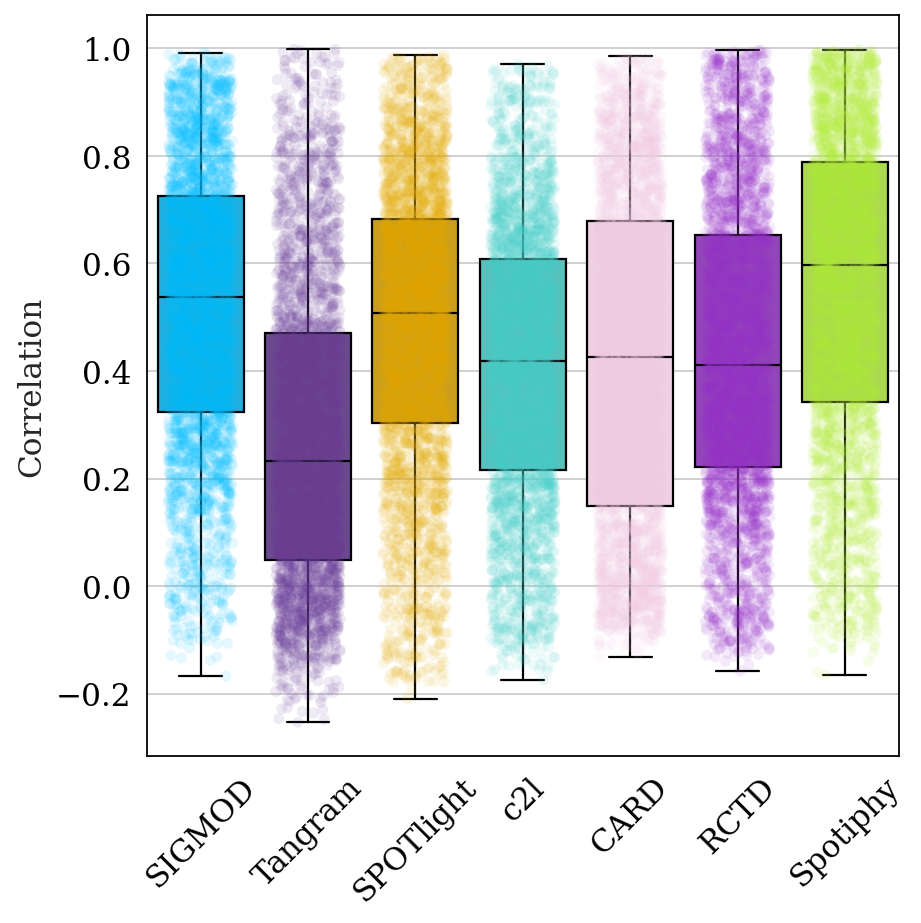

In [234]:
sc.set_figure_params(vector_friendly=True, dpi_save=300) 
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams.update({
    'pdf.fonttype': 42, 
    'ps.fonttype': 42 
})

plt.figure(figsize=(6, 6))
ax = sns.boxplot( x='Methods', y='Cor', data=deconv_cor_df_melt, palette=mt_colors,
                  boxprops=dict(edgecolor='black', linewidth=1),
                  whiskerprops=dict(color='black', linewidth=1),
                  capprops=dict(color='black', linewidth=1),
                  medianprops=dict(color='black', linewidth=1),
                  flierprops=dict(marker='o', markersize=0) )
sns.stripplot(data=deconv_cor_df_melt, x="Methods", y="Cor",
              hue="Methods", jitter=0.3, alpha=0.1, palette=mt_colors, ax=ax)

# # define your reference and all other methods
# ref = "SIGMOD"
# methods = sorted(deconv_cor_df_melt['Methods'].unique())
# pairs = [ (ref, m) for m in methods if m != ref ]

# annotator = Annotator(
#     ax, 
#     pairs, 
#     x="Methods", 
#     y="Cor", 
#     data=deconv_cor_df_melt
# )
# annotator.configure(
#     test="Mann-Whitney",     # or "t-test_ind" / "Wilcoxon" / etc.
#     text_format="star",       # or "simple" to show exact p‐values
#     loc="outside", 
#     comparisons_correction="bonferroni"
# )
# annotator.apply_and_annotate()

plt.xticks(rotation=45)
plt.ylabel("Correlation")
plt.xlabel(None)
plt.tight_layout()
plt.savefig("Figure/3_1_Spots_Cor.pdf",dpi=300)
plt.show()

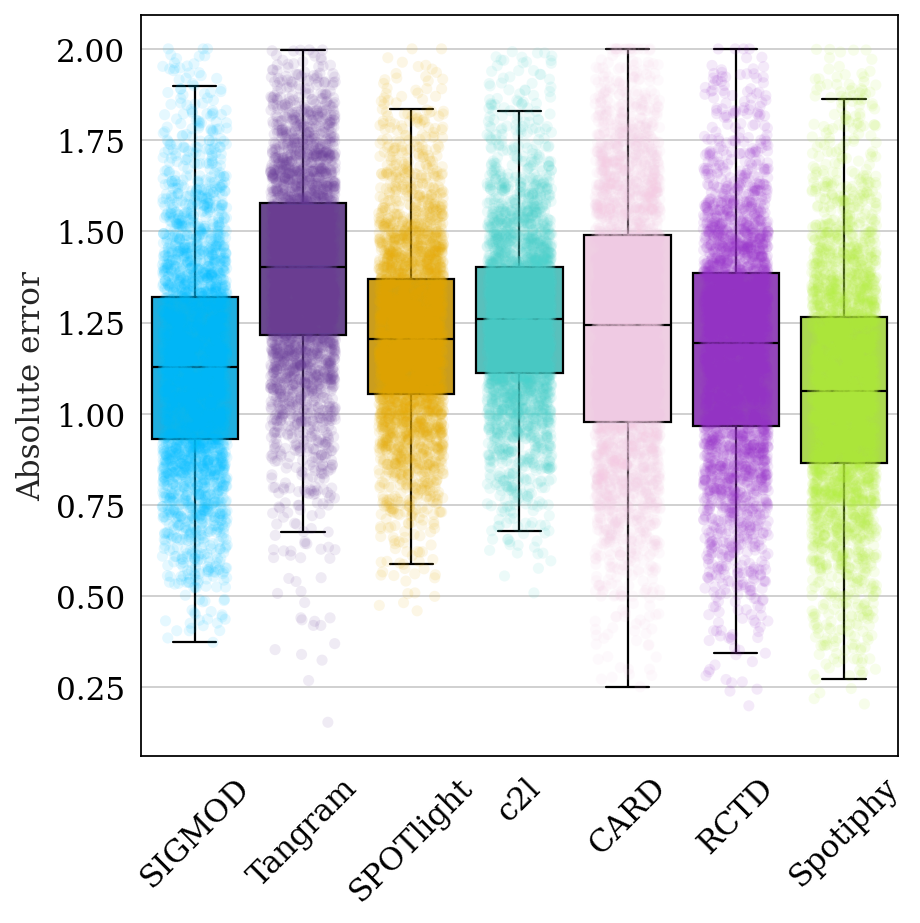

In [235]:
absolute_err_df_melt = absolute_err_df.melt()
absolute_err_df_melt.columns = ['Methods', 'abe']
# category_order = ["SIGMOD","Spotiphy", "c2l", "CytoSPACE", "CARD", "Tangram", 
#                   "RCTD","SpaScope","SpaDWLS","CIBERSORT","SPOTlight"]
# absolute_err_df_melt['Methods'] = pd.Categorical(absolute_err_df_melt['Methods'], 
#                                           categories=category_order, 
#                                           ordered=True)
category_order = ["SIGMOD","Tangram","SPOTlight","c2l","CARD","RCTD","Spotiphy"]
absolute_err_df_melt = absolute_err_df_melt[absolute_err_df_melt.Methods.isin(category_order)]
absolute_err_df_melt['Methods'] = pd.Categorical(absolute_err_df_melt['Methods'], 
                                          categories=category_order, 
                                          ordered=True)


sc.set_figure_params(vector_friendly=True, dpi_save=300) 
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams.update({
    'pdf.fonttype': 42, 
    'ps.fonttype': 42 
})

plt.figure(figsize=(6, 6))
ax = sns.boxplot( x='Methods', y='abe', data=absolute_err_df_melt, palette=mt_colors,
                  boxprops=dict(edgecolor='black', linewidth=1),
                  whiskerprops=dict(color='black', linewidth=1),
                  capprops=dict(color='black', linewidth=1),
                  medianprops=dict(color='black', linewidth=1),
                  flierprops=dict(marker='o', markersize=0) )
sns.stripplot(data=absolute_err_df_melt, x="Methods", y="abe",
              hue="Methods", jitter=0.3, alpha=0.1, palette=mt_colors, ax=ax)

# # define your reference and all other methods
# ref = "SIGMOD"
# methods = sorted(absolute_err_df_melt['Methods'].unique())
# pairs = [ (ref, m) for m in methods if m != ref ]

# annotator = Annotator(
#     ax, 
#     pairs, 
#     x="Methods", 
#     y="abe", 
#     data=absolute_err_df_melt
# )
# annotator.configure(
#     test="Mann-Whitney",     # or "t-test_ind" / "Wilcoxon" / etc.
#     text_format="star",       # or "simple" to show exact p‐values
#     loc="outside", 
#     comparisons_correction="bonferroni"
# )
# annotator.apply_and_annotate()

plt.xticks(rotation=45)
plt.ylabel("Absolute error")
plt.xlabel(None)
plt.tight_layout()
plt.savefig("Figure/3_2_Spots_abe.pdf",dpi=300)
plt.show()

In [203]:
ct_cor_df.index = celltypes
ct_cor_df = ct_cor_df.dropna()

<Axes: >

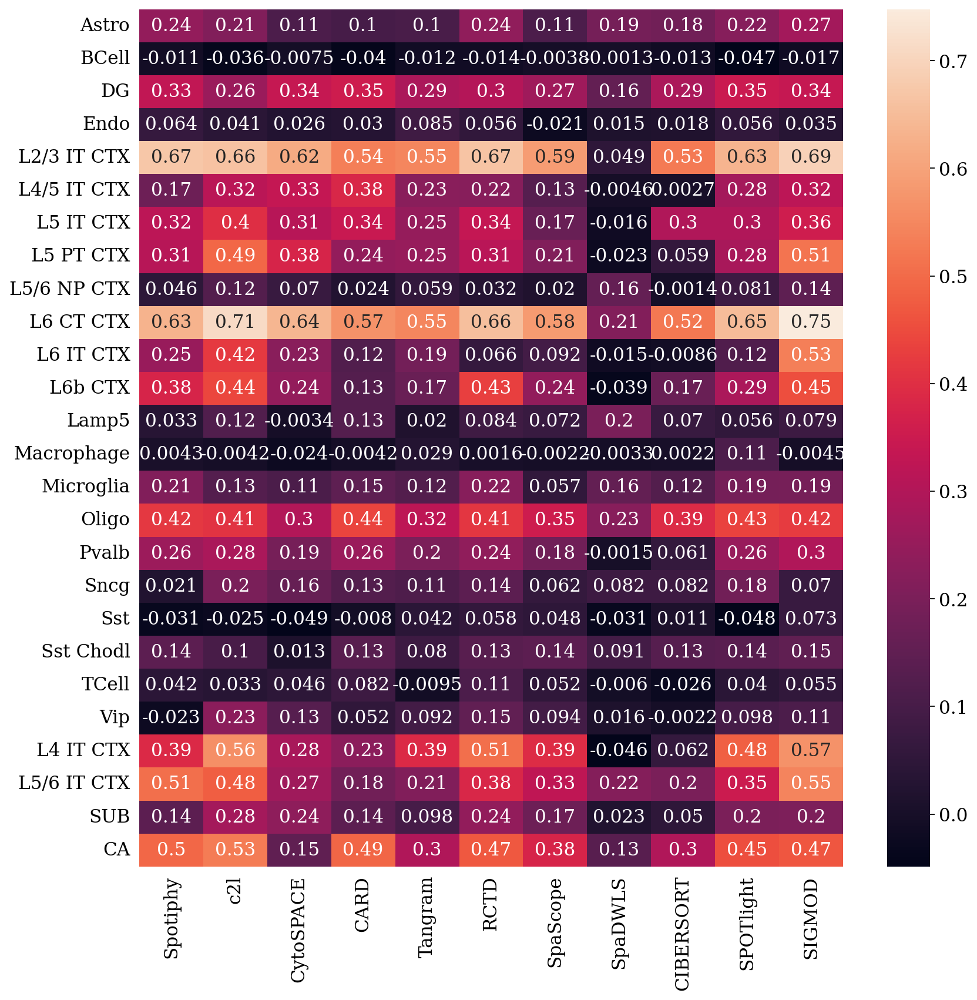

In [204]:
plt.figure(figsize=(12, 12))
sns.heatmap(ct_cor_df,annot=True)

In [205]:
from plottable import ColumnDefinition, Table

In [206]:
ct_cor_df_sub = ct_cor_df.loc[:,category_order]

In [207]:
plot_df = ct_cor_df_sub.T
plot_df["MeanCor"] = ct_cor_df_sub.T.mean(axis=1)
plot_df["Method"] = plot_df.index

In [208]:
plot_df = plot_df.rename(columns={'Macrophage': 'Mac'})

In [209]:
score_cols = ["MeanCor"]
other_cols = list(plot_df.columns)[:-1]

In [210]:
from plottable.cmap import normed_cmap
from plottable.plots import bar
import matplotlib as mpl
cmap_fn = lambda col_data: normed_cmap(col_data, cmap=mpl.cm.PRGn, num_stds=2.5)

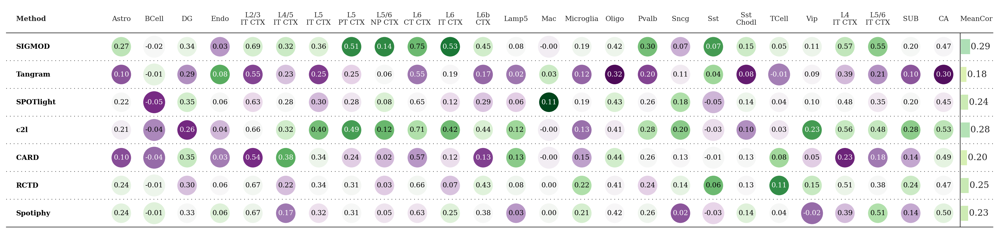

In [236]:
column_definitions = [
    ColumnDefinition("Method", width=1.5, textprops={"ha": "left", "weight": "bold"}),
]
# Circles for the metric values
column_definitions += [
    ColumnDefinition(
        col,
        title=col.replace(" ", "\n", 1),
        width=0.5,
        textprops={
            "ha": "center",
            "bbox": {"boxstyle": "circle", "pad": 0.25},
        },
        cmap=cmap_fn(plot_df[col]),
        formatter="{:.2f}",
    )
    for i, col in enumerate(other_cols)
]
# Bars for the aggregate scores
column_definitions += [
    ColumnDefinition(
        col,
        width=0.5,
        title=col.replace(" ", "\n", 1),
        plot_fn=bar,
        plot_kw={
            "cmap": mpl.cm.YlGnBu,
            "plot_bg_bar": False,
            "annotate": True,
            "height": 0.9,
            "formatter": "{:.2f}",
        },
        border="left" if i == 0 else None,
    )
    for i, col in enumerate(score_cols)
]
# Allow to manipulate text post-hoc (in illustrator)
with mpl.rc_context({"svg.fonttype": "none"}):
    fig, ax = plt.subplots(figsize=(len(plot_df.columns) * 1, 3 + 0.5 * plot_df.shape[0]))
    tab = Table(
        plot_df,
        cell_kw={
            "linewidth": 0,
            "edgecolor": "k",
        },
        column_definitions=column_definitions,
        ax=ax,
        row_dividers=True,
        footer_divider=True,
        textprops={"fontsize": 11, "ha": "center","family": "DeJavu Serif"},
        row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
        col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
        column_border_kw={"linewidth": 1, "linestyle": "-"},
        index_col="Method",
    ).autoset_fontcolors(colnames=plot_df.columns)

plt.show()

fig.savefig("Figure/3_3_ct_cor_table.pdf", facecolor=ax.get_facecolor(), dpi=300)

### Draw Environment Effects
### Cell Cell Interaction

In [212]:
import sys
sys.path.append("..")

from SIGMOD import SIGMOD_CCI as cci

In [213]:
import sys
sys.path.append("..")

from SIGMOD import SIGMOD_plot as sigmod_plot

In [27]:
adata_st = sc.read_h5ad("Data/AD.h5ad")
sc.pp.normalize_total(adata_st, target_sum=1e4)
sc.pp.log1p(adata_st)

In [28]:
st_location = pd.read_csv("Data/visium-v1_coordinates.txt",
                          index_col=0,sep = "\t",header=None,names = ["row","col"])
st_location.index = [i+"-1" for i in st_location.index]
st_location = st_location.loc[adata_st.obs.index,]

adata_st.obs[['x','y']] = st_location.loc[:,['row','col']].values

pos = adata_st.obs.loc[:,["x","y"]]

In [29]:
adata_sc = sc.read_h5ad("Data/sc_all.h5ad")
sc.pp.normalize_total(adata_sc, target_sum=1e4)
sc.pp.log1p(adata_sc)

In [30]:
adata_sc.obs.cluster_man.unique()

array(['Microglia', 'Oligo', 'Astro', 'BCell', 'TCell', 'Macrophage',
       'Neutrophil', 'L5/6 NP CTX', 'L5/6 IT CTX', 'L6 IT CTX',
       'L6 CT CTX', 'Sst Chodl', 'Vip', 'L6b CTX', 'L5 IT CTX', 'Sncg',
       'L4/5 IT CTX', 'Lamp5', 'Pvalb', 'L5 PT CTX', 'L2/3 IT CTX', 'Sst',
       'CA', 'L4 IT CTX', 'Endo', 'SUB', 'DG'], dtype=object)

In [214]:
eta = pd.read_csv("Results/SIGMOD_eta_scaled.csv",index_col=0)
eta.index = ["Niche" + str(i+1) for i in range(12)]

In [215]:
niche_construct = pd.read_csv('./Results/SVLR/LR_niche_topic12_0512.csv',index_col=0).T # should be ligand_receptor x niche

In [216]:
lr_celltype = niche_construct.values @ eta
lr_celltype.index = niche_construct.index

In [217]:
# print(lr_celltype.sort_values("Microglia"))
print(lr_celltype.loc["Apoe_Trem2",])

Astro          0.102272
BCell         -0.069289
CA            -0.047691
DG            -0.030761
Endo          -0.040900
L2/3 IT CTX   -0.129726
L4 IT CTX     -0.048919
L4/5 IT CTX   -0.086209
L5 IT CTX     -0.049190
L5 PT CTX     -0.047804
L5/6 IT CTX   -0.014632
L5/6 NP CTX   -0.063242
L6 CT CTX     -0.024418
L6 IT CTX     -0.049880
L6b CTX       -0.059923
Lamp5         -0.065403
Macrophage    -0.065973
Microglia      0.022786
Neutrophil    -0.002768
Oligo          0.040399
Pvalb          0.025222
Sncg          -0.064147
Sst           -0.062992
Sst Chodl     -0.070978
SUB           -0.030535
TCell         -0.065081
Vip           -0.074063
Name: Apoe_Trem2, dtype: float64


In [218]:
ligands = [i[0] for i in lr_celltype.index.str.split("_")]
receptors = [i[1] for i in lr_celltype.index.str.split("_")]
ligands = list(set(ligands))
receptors = list(set(receptors))
lr = ligands.copy()
lr.extend(receptors)
lr = list(set(lr) & set(adata_sc.var_names))

In [219]:
print(len(lr))

147


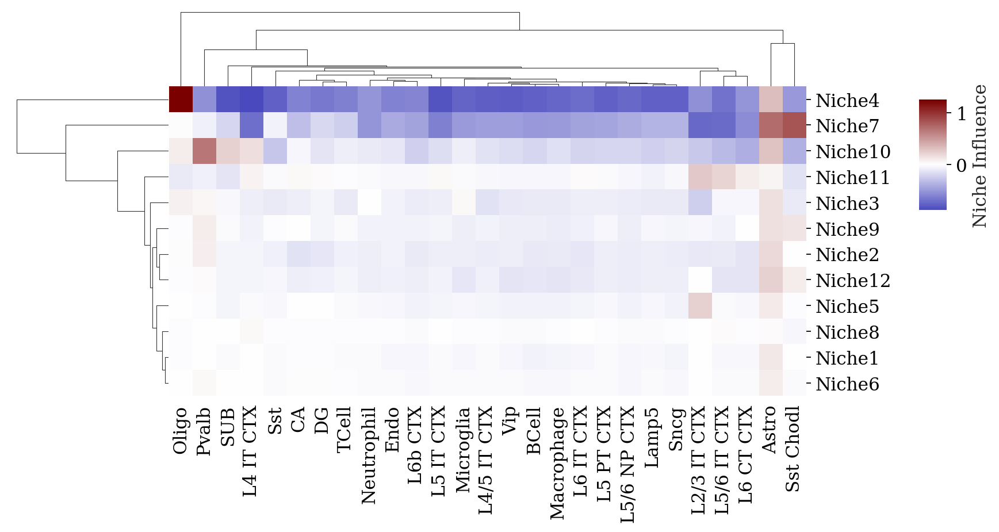

In [238]:
high_color = "#7A0000"
low_color = "#0000A3"
cmap = LinearSegmentedColormap.from_list(
    'niche_influence_cmap',
    [low_color, 'white', high_color]
)

# draw a clustered heatmap (rows & columns clustered)
cg = sns.clustermap(
    eta,
    cmap=cmap,
    center=0,
    # vmin=-1, vmax=1,
    row_cluster=True,
    col_cluster=True,
    figsize=(10, 6),
    cbar_kws={'label': 'Niche Influence'}
)

cg.cax.set_position([1.01, 0.60, 0.03, 0.20])

plt.show()

# save as PDF
cg.fig.savefig(
    "./Figure/4_scaled_eta.pdf",
    format='pdf',
    bbox_inches='tight'
)

plt.show()

In [239]:
theta = sigmod.loc[pos.index,]

In [240]:

tau = cci.SE_kernel(X=pos.iloc[:, [0, 1]], length_scale=6/2)

spatial_corr = cci.compute_spatial_corr_matrix(theta,tau)

Computing spatial correlations:   0%|          | 0/27 [00:00<?, ?it/s]

In [223]:
lr_effect = cci.get_lr_effect(niche_construct, eta)
diff_lr = cci.get_diff_lr(adata_sc,"cluster_man",lr)
select_lr,l_exp,r_exp = cci.generate_matched_lr(lr_effect.T, diff_lr.T)
masked_r_exp = cci.mask_lr_effect(lr_effect.T,r_exp)

In [224]:
## check whether l_exp index and spatial_corr column name same or not?
print(l_exp.index)
print(spatial_corr.columns)

Index(['Astro', 'BCell', 'CA', 'DG', 'Endo', 'L2/3 IT CTX', 'L4 IT CTX',
       'L4/5 IT CTX', 'L5 IT CTX', 'L5 PT CTX', 'L5/6 IT CTX', 'L5/6 NP CTX',
       'L6 CT CTX', 'L6 IT CTX', 'L6b CTX', 'Lamp5', 'Macrophage', 'Microglia',
       'Neutrophil', 'Oligo', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'SUB',
       'TCell', 'Vip'],
      dtype='object')
Index(['Astro', 'BCell', 'CA', 'DG', 'Endo', 'L2/3 IT CTX', 'L4 IT CTX',
       'L4/5 IT CTX', 'L5 IT CTX', 'L5 PT CTX', 'L5/6 IT CTX', 'L5/6 NP CTX',
       'L6 CT CTX', 'L6 IT CTX', 'L6b CTX', 'Lamp5', 'Macrophage', 'Microglia',
       'Neutrophil', 'Oligo', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'SUB',
       'TCell', 'Vip'],
      dtype='object')


In [225]:
spatial_corr_pos = spatial_corr.copy()
spatial_corr_pos[spatial_corr_pos<0]=0
masked_r_exp_pos = masked_r_exp.copy()
masked_r_exp_pos[masked_r_exp_pos<0]=0
interaction_dict = cci.compute_interaction_dict(spatial_corr_pos,l_exp,masked_r_exp_pos)

In [226]:
mats = list(interaction_dict.values())

total_interaction = sum(mats[1:], mats[0])

In [227]:
colors = ["#FFD92F", "#4DAF4A", "#FCCDE5", "#D9D9D9", "#377EB8", "#7FC97F", "#BEAED4",
    "#FDC086", "#FFFF99", "#386CB0", "#F0027F", "#BF5B17", "#666666", "#1B9E77",
    "#D95F02", "#7570B3", "#E7298A", "#66A61E", "#E6AB02", "#A6761D", "#E41A1C",
    "#FF7F00", "#984EA3", "#A65628", "#F781BF", "#999999", "#8DD3C7"]

celltypes = ['Astro', 'BCell', 'CA', 'DG', 'Endo', 'L2/3 IT CTX', 'L4 IT CTX',
       'L4/5 IT CTX', 'L5 IT CTX', 'L5 PT CTX', 'L5/6 IT CTX', 'L5/6 NP CTX',
       'L6 CT CTX', 'L6 IT CTX', 'L6b CTX', 'Lamp5', 'Macrophage', 'Microglia',
       'Neutrophil', 'Oligo', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'SUB',
       'TCell', 'Vip']

In [228]:
node_color_map = {}
for celltype, color in zip(celltypes,colors):
    node_color_map[celltype] = color

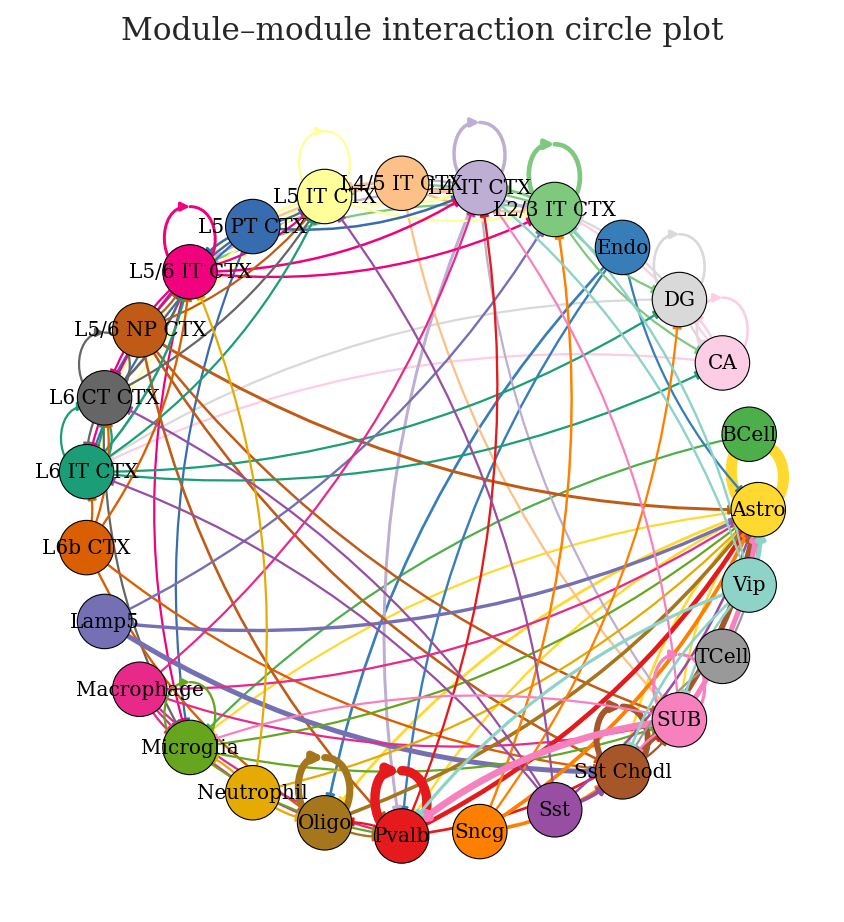

In [241]:
sigmod_plot.plot_circle_interactions(total_interaction,node_color_map,threshold=0,
                                     edge_cmap="Reds",max_width=5,min_width=1,figsize=(5.5,6),
                                     file_name="Figure/5_1_TotalInteraction.pdf")

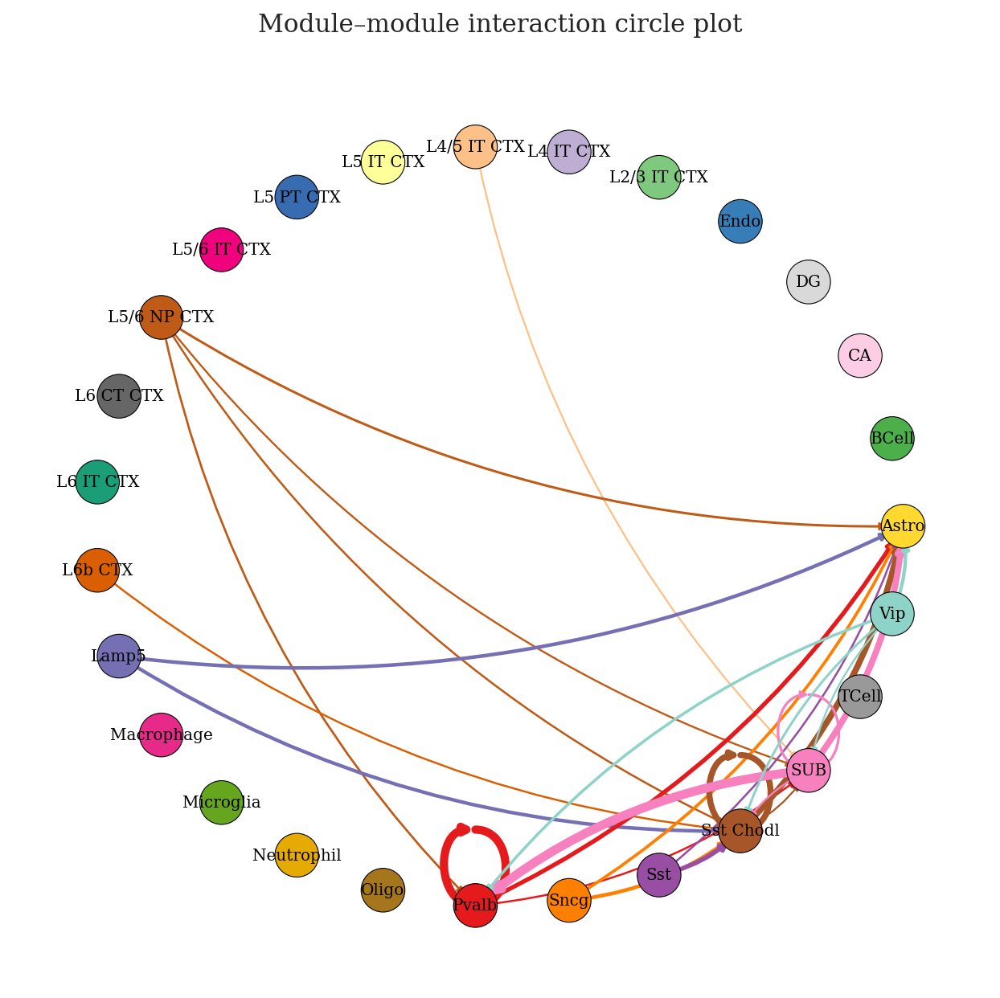

In [230]:
sigmod_plot.plot_circle_interactions(interaction_dict["L1cam_Cntn1"],node_color_map,
                                     edge_cmap="Reds",max_width=5,min_width=1,
                                     file_name=None)

In [258]:
result = (
    pd.concat(interaction_dict)
      .stack()
      .reset_index(name='value')
      .rename(columns={
          'level_0': 'LR',
          'level_1': 'source',
          'level_2': 'target'
      })
      )

In [272]:
# filtered = result[result.source.isin(['Cancer clone A','Cancer clone B','Fibroblasts'])]
filtered = result[result.LR.str.contains('Apoe')]
filtered = filtered[filtered.value >0]
filtered["cellpair"] = filtered["source"] + "-" + filtered["target"]

In [273]:
filtered

,LR,source,target,value,cellpair
50318,Apoe_Trem2,Astro,Microglia,0.001581,Astro-Microglia
50345,Apoe_Trem2,BCell,Microglia,0.002668,BCell-Microglia
50750,Apoe_Trem2,Macrophage,Microglia,0.029920,Macrophage-Microglia
50777,Apoe_Trem2,Microglia,Microglia,0.057520,Microglia-Microglia
50804,Apoe_Trem2,Neutrophil,Microglia,0.021349,Neutrophil-Microglia


In [251]:
filtered_wide = pd.pivot(filtered,index="cellpair",columns="LR",values="value",)
filtered_wide = filtered_wide.fillna(0)

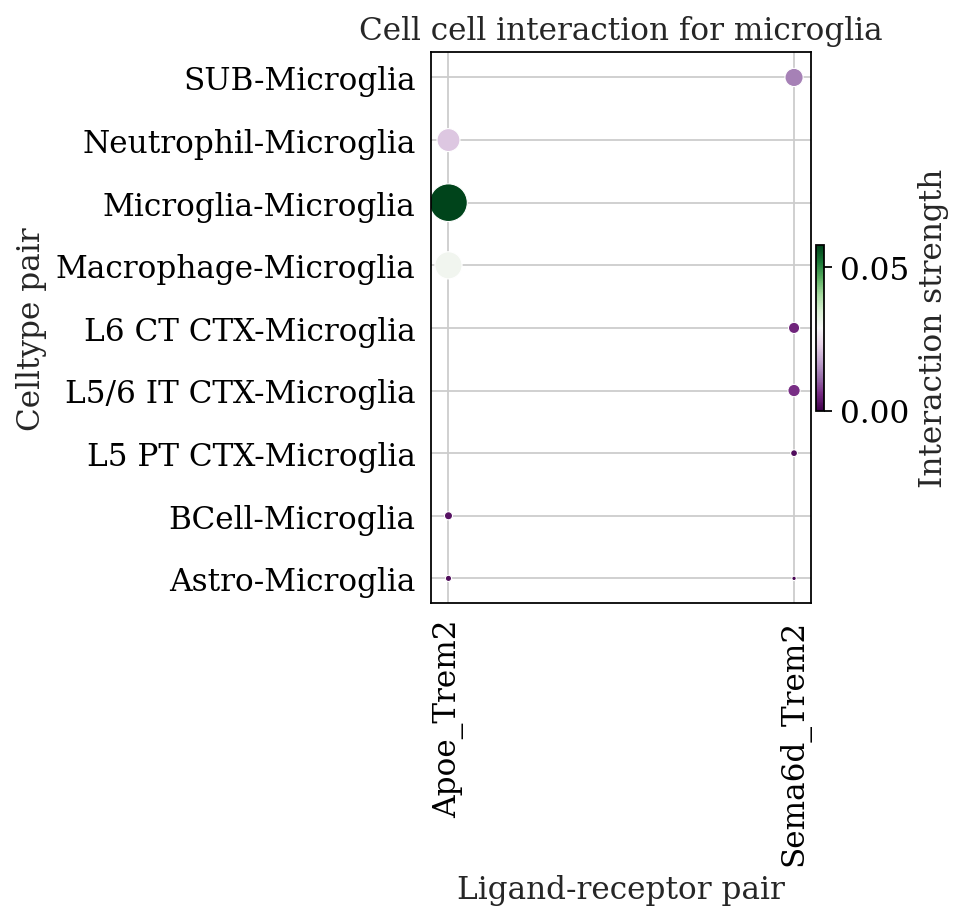

In [256]:
plt.figure(figsize=(6, 6))
group2_names = filtered_wide.index
group1_names = filtered_wide.columns

x, y = np.meshgrid(group1_names, group2_names)

x = x.flatten()
y = y.flatten()
exp_values = filtered_wide.values.flatten()
percent_values = filtered_wide.values.flatten()

scatter = plt.scatter(x, y, c=exp_values, s=percent_values*5000, cmap='PRGn',
                       alpha=1, edgecolors="w", linewidth=0.5)

plt.colorbar(scatter, label='Interaction strength',pad=0.01,shrink=0.3)

# legend_sizes = [3,2,1.5,1,0]
# legend_sizes_scaled = [size * 50 for size in legend_sizes]
# legend_labels = ["P val < 1e-3",
#                  "P val < 1e-2",
#                  "P val < 5e-2",
#                  "P val < 1e-1",
#                  "P val > 1e-1",]

# for size, scaled_size, label in zip(legend_sizes, legend_sizes_scaled, legend_labels):
#     plt.scatter([], [], s=scaled_size, c='gray', alpha=0.7, edgecolors="w", label=label)

# plt.legend(title='P value', loc='center left', bbox_to_anchor=(1.01, 0.15), frameon=False)

plt.xlabel('Ligand-receptor pair')
plt.ylabel('Celltype pair')
plt.title('Cell cell interaction for microglia')

plt.xticks(np.arange(len(group1_names)), group1_names, rotation=90)
plt.yticks(np.arange(len(group2_names)), group2_names)

plt.tight_layout()
plt.savefig("Figure/5_2_CCI.pdf",dpi=300)
plt.show()

## Visiulaize Cell type distributions
## Visiulaize inferred attention

In [144]:
adata_st.obs["y_1"] = adata_st.obs["y"].to_numpy() * (-1)
adata_st.obs["y"] = adata_st.obs["y_1"]
adata_st.obsm["spatial"] = adata_st.obs[["x", "y_1"]].copy().to_numpy()

In [39]:
ex_neurons = ['L2/3 IT CTX', 'L4 IT CTX','L4/5 IT CTX','L5 PT CTX','L6 CT CTX','L6b CTX','CA',
              'L5 IT CTX','L5/6 IT CTX','L5/6 NP CTX','L6 IT CTX','DG','SUB', ]
inh_neurons = ['Pvalb','Lamp5','Sst Chodl','Sncg', 'Sst','Vip']
glia_cells = ['Oligo','Astro',]
immune = ['Microglia','Neutrophil','TCell','BCell','Macrophage']
endo = ['Endo']

In [59]:
true_prop = pd.DataFrame(
    {"ex_neurons":deconv_res[0][ex_neurons].sum(axis=1).values,
     "inh_neurons":deconv_res[0][inh_neurons].sum(axis=1).values,
     "glia_cells":deconv_res[0][immune].sum(axis=1).values,
     "endo":deconv_res[0][endo].sum(axis=1).values}
    )
true_prop.index = deconv_res[0].index

In [57]:
import importlib
importlib.reload(sigmod_plot)

<module 'SIGMOD.SIGMOD_plot' from '/home/liuchang/3.0_Result/4.0_NGDeonv/0315/mouseBrain/../SIGMOD/SIGMOD_plot.py'>

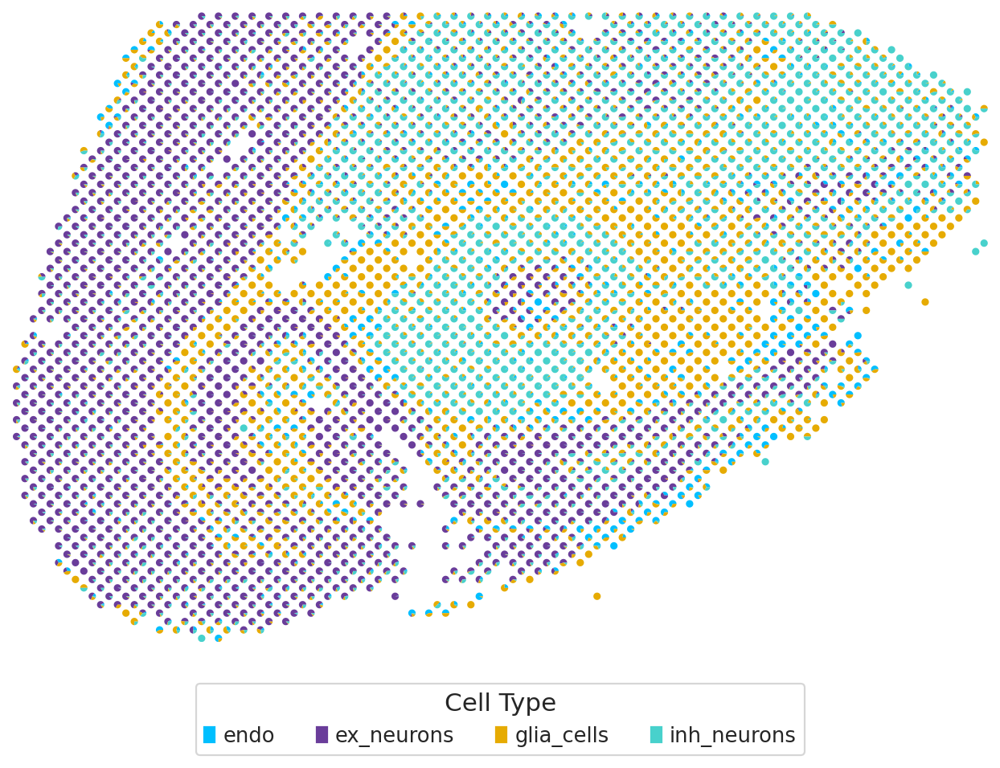

In [61]:
sigmod_plot.draw_spatial_pie(true_prop, adata_st.obs.loc[true_prop.index,], 
                             colors=["#00BFFF", "#6A3D9A","#E6AB02", "#48D1CC"],
                            figsize = (8,8),
                             file_name="5_1_spotiphy_PiePlot.pdf")

In [245]:
niche_res = pd.read_csv("Results/SVLR/niche_res_topic12_0512.csv")
mu = niche_res @ eta.values
mu.columns = eta.columns
mu.index = adata_st.obs_names

In [246]:
ex_neurons = ['L2/3 IT CTX', 'L4 IT CTX','L4/5 IT CTX','L5 PT CTX','L6 CT CTX','L6b CTX','CA']

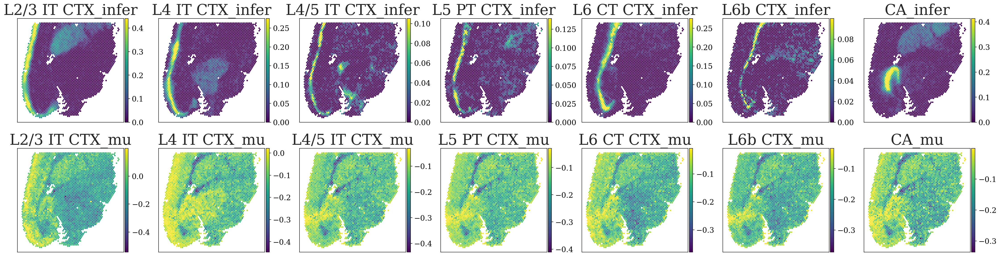

In [247]:
ex_neurons_mu = [i+"_mu" for i in ex_neurons]
ex_neurons_inferred = [i+"_infer" for i in ex_neurons]
adata_st.obs[ex_neurons_inferred] = theta[ex_neurons]
adata_st.obs[ex_neurons_mu] =  mu[ex_neurons]
all = ex_neurons_inferred.copy()
all.extend(ex_neurons_mu)

ax = sc.pl.embedding(
    adata_st,
    basis="spatial",
    show=False,
    color=all,
    cmap="viridis",
    vmax='p99',
    #size=12,
    ncols=7,
)

# Manually set rasterization for collections
for a in plt.gcf().axes:  # Traverse each axis
    if hasattr(a, 'collections'):
        for collection in a.collections:
            collection.set_rasterized(True)  # Rasterize the points to reduce file size

# # Adjust colorbar font size
for ax in plt.gcf().axes:
    if isinstance(ax, plt.Axes):
        if hasattr(ax, 'collections') and ax.collections:
            for collection in ax.collections:
                if hasattr(collection, 'colorbar') and collection.colorbar:
                    cbar = collection.colorbar
                    cbar.ax.tick_params(labelsize=15)  # Set colorbar tick font size
    ax.set_xlabel('')  # Clear x-axis label
    ax.set_ylabel('')  # Clear y-axis label

cellsForplot_with_spaces = []
for element in all:
    cellsForplot_with_spaces.append(element)
    cellsForplot_with_spaces.append("")

for ax, title in zip(plt.gcf().axes, cellsForplot_with_spaces):
    if isinstance(ax, plt.Axes):
        ax.set_title(title, fontsize=30)

# ax.invert_yaxis()
# ax.set_aspect("equal")

plt.tight_layout()  # Adjust layout to fit titles properly 
# remove bbox_inches='tight' for color legend show
plt.savefig('Figure/6_1_SpatialPlot_Ex.pdf', dpi=300)
plt.show()

In [248]:
inh_neurons = ['Pvalb','Lamp5','Sst Chodl']
glia_cells = ['Oligo','Astro']
immune = ['Microglia','Neutrophil']
inh_neurons.extend(glia_cells)
inh_neurons.extend(immune)

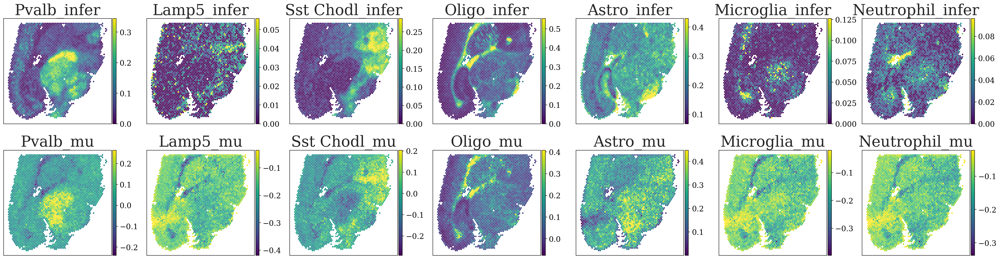

In [250]:
inh_neurons_mu = [i+"_mu" for i in inh_neurons]
inh_neurons_inferred = [i+"_infer" for i in inh_neurons]
adata_st.obs[inh_neurons_inferred] = theta[inh_neurons]
adata_st.obs[inh_neurons_mu] =  mu[inh_neurons]
all = inh_neurons_inferred.copy()
all.extend(inh_neurons_mu)

ax = sc.pl.embedding(
    adata_st,
    basis="spatial",
    show=False,
    color=all,
    cmap="viridis",
    vmax='p99',
    #size=12,
    ncols=7,
)

# Manually set rasterization for collections
for a in plt.gcf().axes:  # Traverse each axis
    if hasattr(a, 'collections'):
        for collection in a.collections:
            collection.set_rasterized(True)  # Rasterize the points to reduce file size

# # Adjust colorbar font size
for ax in plt.gcf().axes:
    if isinstance(ax, plt.Axes):
        if hasattr(ax, 'collections') and ax.collections:
            for collection in ax.collections:
                if hasattr(collection, 'colorbar') and collection.colorbar:
                    cbar = collection.colorbar
                    cbar.ax.tick_params(labelsize=15)  # Set colorbar tick font size
    ax.set_xlabel('')  # Clear x-axis label
    ax.set_ylabel('')  # Clear y-axis label

cellsForplot_with_spaces = []
for element in all:
    cellsForplot_with_spaces.append(element)
    cellsForplot_with_spaces.append("")

for ax, title in zip(plt.gcf().axes, cellsForplot_with_spaces):
    if isinstance(ax, plt.Axes):
        ax.set_title(title, fontsize=30)

# ax.invert_yaxis()
# ax.set_aspect("equal")

plt.tight_layout()  # Adjust layout to fit titles properly 
# remove bbox_inches='tight' for color legend show
plt.savefig('Figure/6_2_SpatialPlot_Oth.pdf', dpi=300)
plt.show()